<a href="https://colab.research.google.com/github/visiont3lab/deep-learning-course/blob/main/colab/PretrainedSegmentationModel.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Semantic Segmentation and background replacement

## Utils

In [ ]:
# Esempio dowload dati
!wget https://raw.githubusercontent.com/visiont3lab/project-work-ifoa/main/data/ita_regioni_zone_correct.csv -O dati.csv

In [ ]:
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1-frfMZLVvyreJjhw-l1bsmBqymswmiRc' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1-frfMZLVvyreJjhw-l1bsmBqymswmiRc" -O deeplabv3_resnet101.onnx
!wget --load-cookies /tmp/cookies.txt "https://docs.google.com/uc?export=download&confirm=$(wget --quiet --save-cookies /tmp/cookies.txt --keep-session-cookies --no-check-certificate 'https://docs.google.com/uc?export=download&id=1OTQSLxy4Yn-ZTrB7EIFQlVWDKcQsEbZB' -O- | sed -rn 's/.*confirm=([0-9A-Za-z_]+).*/\1\n/p')&id=1OTQSLxy4Yn-ZTrB7EIFQlVWDKcQsEbZB" -O deeplabv3_resnet50.onnx

In [6]:
# Download from drive
import requests

def download_file_from_google_drive(id, destination):
    URL = "https://docs.google.com/uc?export=download"

    session = requests.Session()

    response = session.get(URL, params = { 'id' : id }, stream = True)
    token = get_confirm_token(response)

    if token:
        params = { 'id' : id, 'confirm' : token }
        response = session.get(URL, params = params, stream = True)

    save_response_content(response, destination)    
    
def get_confirm_token(response):
    for key, value in response.cookies.items():
        if key.startswith('download_warning'):
            return value

    return None

def save_response_content(response, destination):
    CHUNK_SIZE = 32768

    with open(destination, "wb") as f:
        for chunk in response.iter_content(CHUNK_SIZE):
            if chunk: # filter out keep-alive new chunks
                f.write(chunk)

if __name__ == "__main__":
    file_id = '1OTQSLxy4Yn-ZTrB7EIFQlVWDKcQsEbZB'
    destination = 'deeplabv3_resnet50.onnx'
    download_file_from_google_drive(file_id, destination)

### Get background images

In [7]:
# Get background images from arcolinux github
!git clone https://github.com/arcolinux/arcolinux-wallpapers.git
!mv arcolinux-wallpapers/usr/share/backgrounds/arcolinux backgrounds
!rm -rf arcolinux-wallpapers

Cloning into 'arcolinux-wallpapers'...
remote: Enumerating objects: 24, done.
remote: Counting objects: 100% (24/24), done.
remote: Compressing objects: 100% (13/13), done.
remote: Total 217 (delta 8), reused 20 (delta 5), pack-reused 193
Receiving objects: 100% (217/217), 112.87 MiB | 39.88 MiB/s, done.
Resolving deltas: 100% (53/53), done.


## Read images using Pillow and Opencv

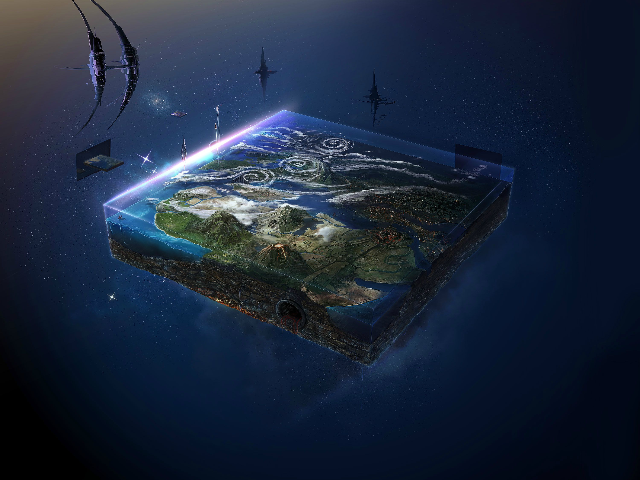

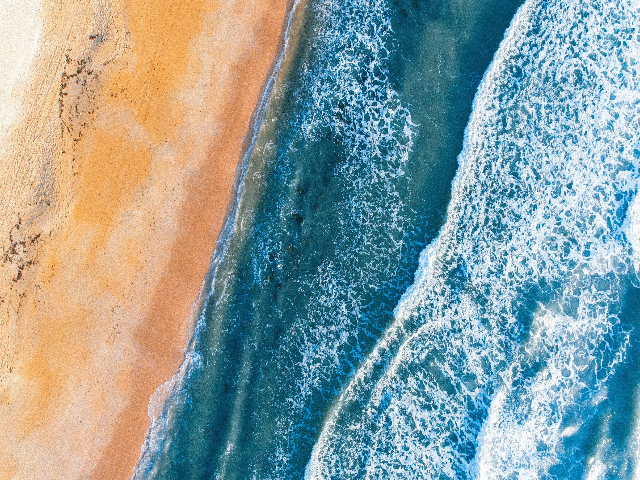

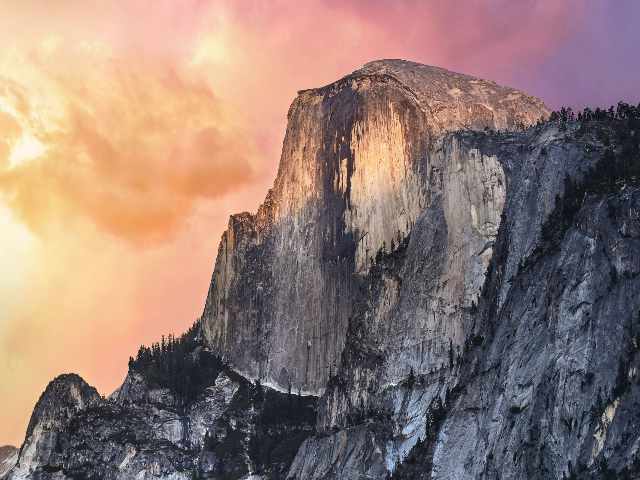

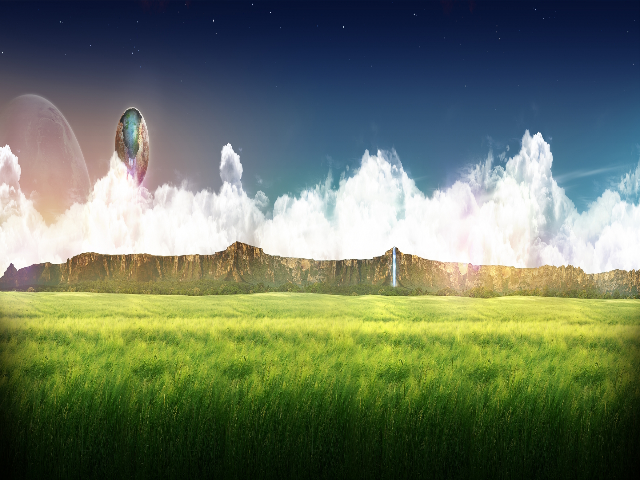

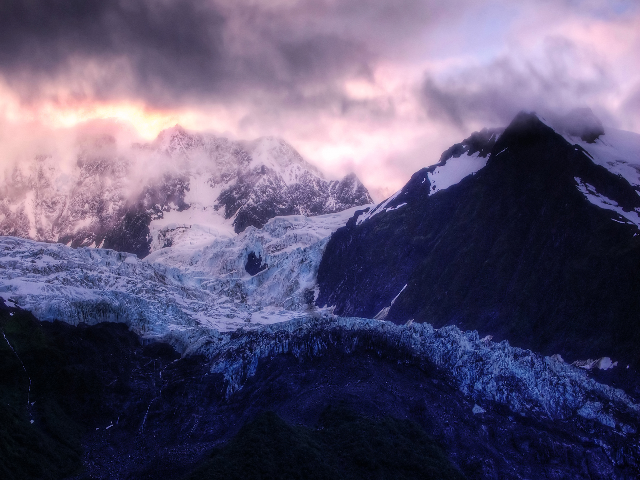

...

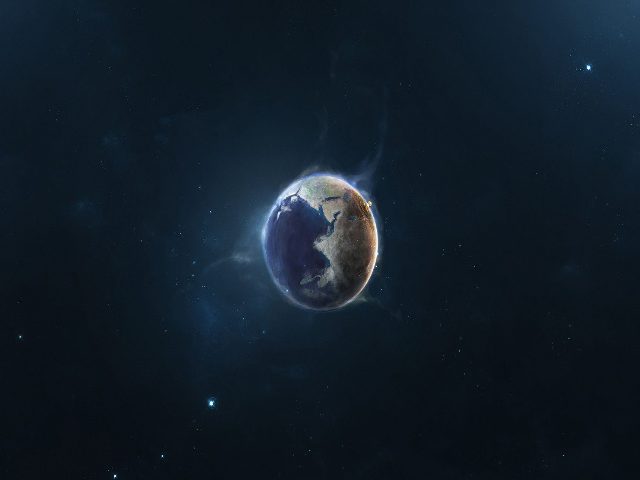

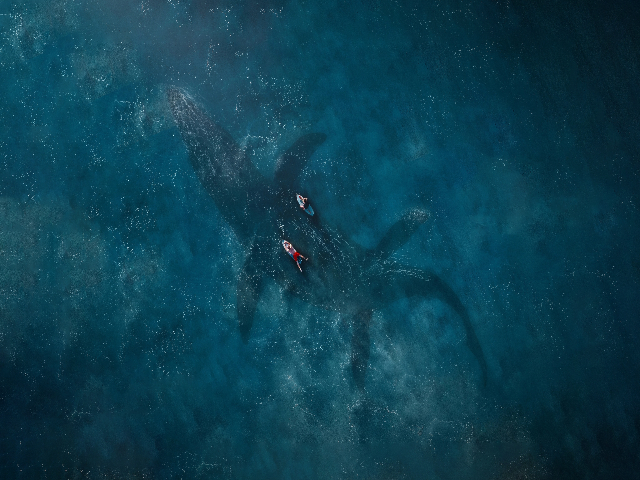

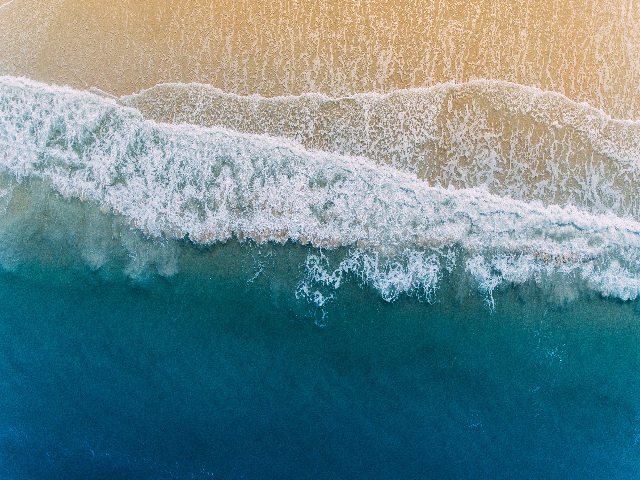

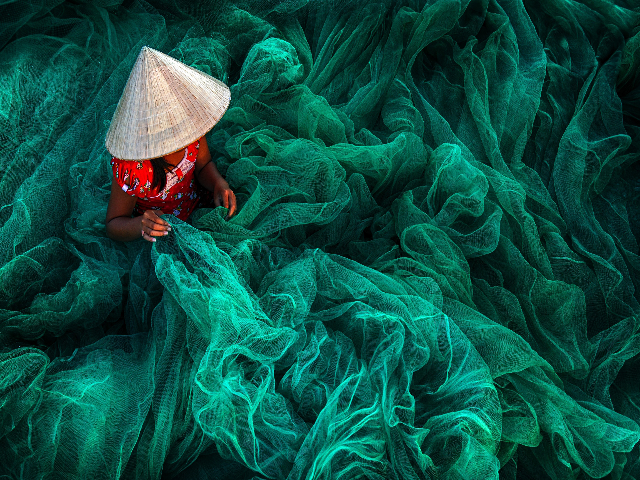

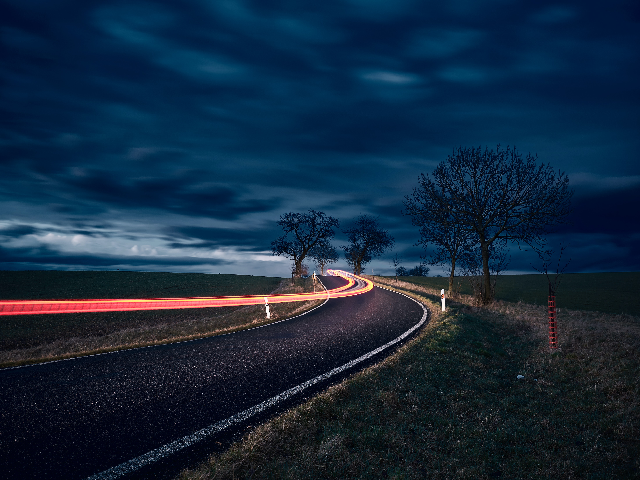

In [8]:
from PIL import Image
import cv2
import os
folder_path = "backgrounds"
names = os.listdir(folder_path)
filenames = [os.path.join(folder_path,name) for name in names]
for filename in filenames:
    # Lettura utilizzando Pillow
    #im_pil = Image.open(filename).convert("RGB").resize((640,480))
    
    # Lettura utilizzando opencv
    im_np = cv2.imread(filename) # BGR
    im_np = cv2.cvtColor(im_np,cv2.COLOR_BGR2RGB )
    im_np = cv2.resize(im_np, (640,480))
    im_pil = Image.fromarray(im_np)

    display(im_pil)

### Get Image

In [9]:
from IPython.display import display, Javascript
from google.colab.output import eval_js
from base64 import b64decode

def take_photo(filename='photo.jpg', quality=0.8):
  js = Javascript('''
    async function takePhoto(quality) {
      const div = document.createElement('div');
      const capture = document.createElement('button');
      capture.textContent = 'Capture';
      div.appendChild(capture);

      const video = document.createElement('video');
      video.style.display = 'block';
      const stream = await navigator.mediaDevices.getUserMedia({video: true});

      document.body.appendChild(div);
      div.appendChild(video);
      video.srcObject = stream;
      await video.play();

      // Resize the output to fit the video element.
      google.colab.output.setIframeHeight(document.documentElement.scrollHeight, true);

      // Wait for Capture to be clicked.
      await new Promise((resolve) => capture.onclick = resolve);

      const canvas = document.createElement('canvas');
      canvas.width = video.videoWidth;
      canvas.height = video.videoHeight;
      canvas.getContext('2d').drawImage(video, 0, 0);
      stream.getVideoTracks()[0].stop();
      div.remove();
      return canvas.toDataURL('image/jpeg', quality);
    }
    ''')
  display(js)
  data = eval_js('takePhoto({})'.format(quality))
  binary = b64decode(data.split(',')[1])
  with open(filename, 'wb') as f:
    f.write(binary)
  return filename

<IPython.core.display.Javascript object>

Saved to photo.jpg


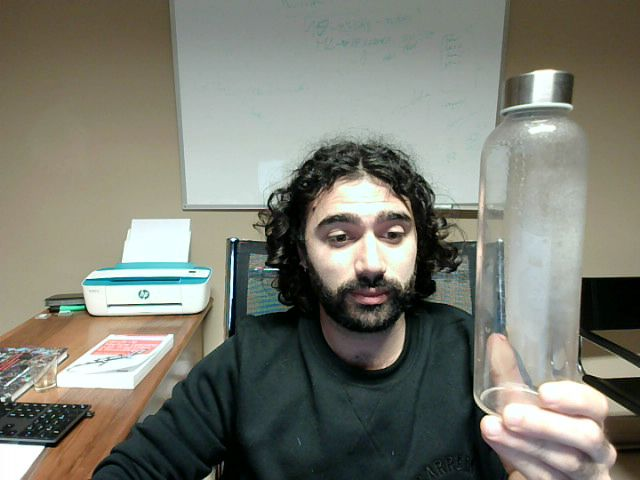

In [10]:
from IPython.display import Image
try:
  filename = take_photo()
  print('Saved to {}'.format(filename))
  
  # Show the image which was just taken.
  display(Image(filename))
except Exception as err:
  # Errors will be thrown if the user does not have a webcam or if they do not
  # grant the page permission to access it.
  print(str(err))

## Apply Pretrained  (Semantic Segmentation Model)


odict_keys(['out', 'aux'])
torch.Size([1, 21, 480, 640])


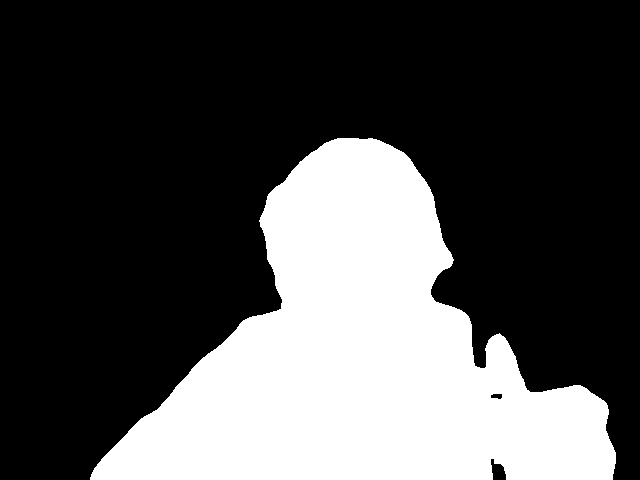

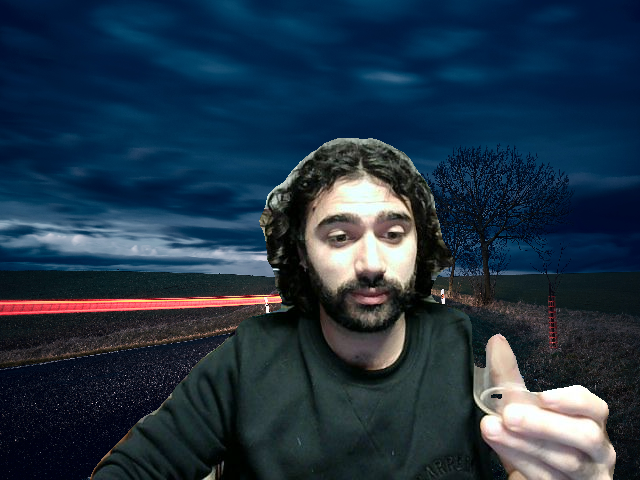

In [34]:
import cv2
import torch
import torchvision
from torchvision.transforms.functional import to_pil_image,to_tensor,normalize
import numpy as np
from PIL import Image
import os 
from torchsummary import summary

# pip3 install torch torchvision opencv-python
# https://towardsdatascience.com/semantic-image-segmentation-with-deeplabv3-pytorch-989319a9a4fb
# https://pytorch.org/vision/stable/models.html#semantic-segmentation

labels = ['__background__', 'aeroplane', 'bicycle', 'bird', 'boat', 'bottle', 'bus',
 'car', 'cat', 'chair', 'cow', 'diningtable', 'dog', 'horse', 'motorbike',
 'person', 'pottedplant', 'sheep', 'sofa', 'train', 'tvmonitor']

# Pscal voc 20 categorie

# Pascal VOC
device = "cuda" if torch.cuda.is_available() else "cpu"

model_h,model_w = (256,256)
#model = torchvision.models.segmentation.fcn_resnet50(pretrained=True)
#model = torchvision.models.segmentation.fcn_resnet101(pretrained=True)
model = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
#model = torchvision.models.segmentation.deeplabv3_resnet101(pretrained=True)
#model = torchvision.models.segmentation.deeplabv3_mobilenet_v3_large(pretrained=True)
#model = torchvision.models.segmentation.lraspp_mobilenet_v3_large(pretrained=True)
model.eval()

#print(model)
#img = torch.randn((3,520, 520))
imagenet_stats = [[0.485, 0.456, 0.406], [0.485, 0.456, 0.406]]

# Read frame
frame = cv2.imread("photo.jpg",1)
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
#display(Image.fromarray(frame))

# Read background
h,w,c = frame.shape
background = cv2.imread("backgrounds/night-glow-5839x3893.jpg",1)
background = cv2.cvtColor(background, cv2.COLOR_BGR2RGB)
background = cv2.resize(background, (w,h) ) # 0-255 480,640,3 --> 3,480,640

idx = 15 # Person

# Predict
with torch.no_grad():
    
    #print(f.shape)
    # Frame tesnor 
    input = cv2.resize(frame,(model_w,model_h))
    input_t = to_tensor(frame)  # 0-1

    # Preprocess
    input_t = normalize(input_t, mean=imagenet_stats[0], std=imagenet_stats[1])
    input_t = input_t.unsqueeze(0)
    input_t = input_t.to(device)

    # Predict
    output_t = model(input_t)
    print(output_t.keys())
    output_t = output_t["out"].cpu() # 1,21,520,520  # out , aux
    print(output_t.shape)
    output_t = torch.argmax(output_t,axis=1) # 1,520,520
    output = output_t[0].numpy()

    # Select person
    #for i in range(1,21):
    #    print(i)
    mask = np.zeros(output.shape, dtype=np.uint8)
    mask[output == idx] = 255  # mask 0-1
    if idx == 0: # background
        mask = cv2.bitwise_not(mask)
    if len(mask.flatten()==255)>20:
        # Erosion
        kernel = np.ones((3,3), np.uint8)
        mask = cv2.erode(mask, kernel) 
    mask = cv2.resize(mask, (w,h))
    mask = np.repeat(mask[:, :, np.newaxis], 3, axis = 2)
    display(to_pil_image(mask))

    # Replace background
    background[mask==255] = frame[mask==255]
    display(to_pil_image(background))

    # Select only person
    #res = cv2.bitwise_and(frame, mask)
    #display(to_pil_image(res))

## Export pretrained model to onnx format

In [ ]:
# define input size
model_h,model_w = (256,256)
B,C,H,W = 1,3,model_h,model_w
input = torch.randn(B, C, H, W)

# It's optional to label the input and output layers
#input_names = [ "actual_input_1" ] + [ "learned_%d" % i for i in range(16) ]
#output_names = [ "output1" ]

# Use the exporter from torch to convert to onnx 
# model (that has the weights and net arch)
#torch.onnx.export(model, input, "deeplabv3_resnet50.onnx", verbose=True, input_names=input_names, output_names=output_names, opset_version=11)
torch.onnx.export(model, input, "deeplabv3_resnet50.onnx", verbose=True, opset_version=11)

## Run onnx saved model

In [ ]:
!pip install onnxruntime

input name input.1
input shape [1, 3, 256, 256]
input type tensor(float)
output name 604
output shape [1, 21, 256, 256]
output type tensor(float)


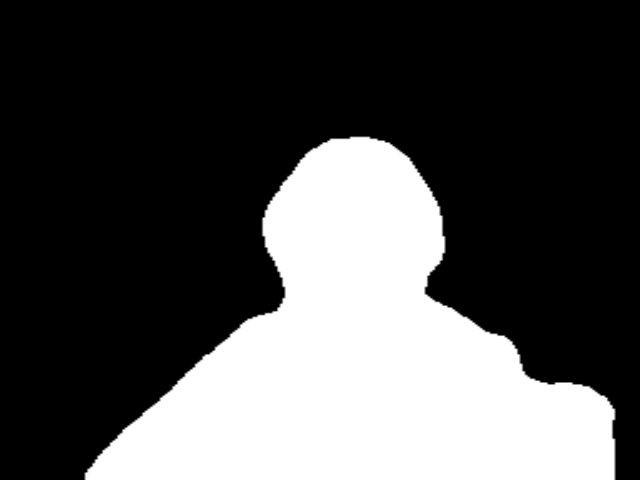

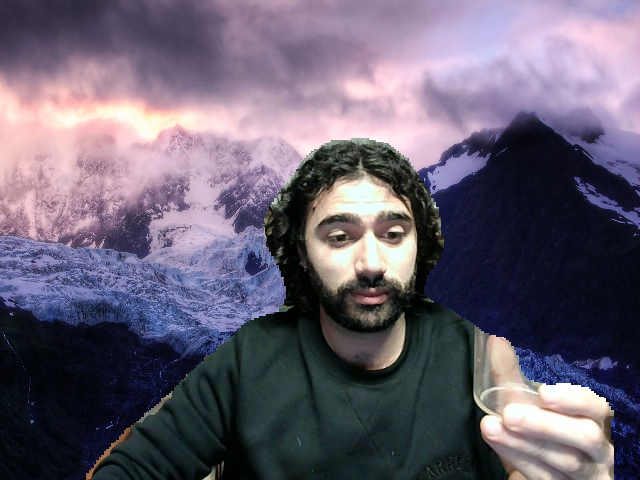

In [33]:
import onnxruntime as rt
import numpy as np
import cv2
from PIL import Image

class SegmentationInference:

    def __init__(self,path2model):
        self.sess = rt.InferenceSession(path2model)
        self.input_name = self.sess.get_inputs()[0].name
        self.input_shape = self.sess.get_inputs()[0].shape
        self.h = self.input_shape[2]
        self.w = self.input_shape[3]
        self.input_type = self.sess.get_inputs()[0].type
        self.output_name = self.sess.get_outputs()[0].name
        self.output_shape = self.sess.get_outputs()[0].shape
        self.output_type = self.sess.get_outputs()[0].type 

    def print_model_info(self):
        # Input informations
        print("input name", self.input_name)
        print("input shape", self.input_shape)
        print("input type", self.input_type)
        # Outpout informations
        print("output name", self.output_name)
        print("output shape", self.output_shape)
        print("output type", self.output_type)

    def predict(self, x):
        x = cv2.resize(x, (self.w,self.h))
        x = x.astype(np.float32)/255.0 #[0-1]
        mean = np.array([0.485, 0.456, 0.406],dtype=np.float32)
        std = np.array([0.485, 0.456, 0.406],dtype=np.float32)
        x = x - mean
        x = x / std
        x = np.transpose(x, (2, 0, 1) ) # BCHW
        x = x[np.newaxis,:,:,:]
        res = self.sess.run([self.output_name], {self.input_name: x})[0]
        res = np.argmax(res, axis=1)[0]
        return res

    def replace_background(self,frame,background,idx):
        # Resize
        h = frame.shape[0]
        w = frame.shape[1]
        background = cv2.resize(background, (w,h))
        
        # Predict
        output = self.predict(frame)
        #print(output.shape,frame.shape,background.shape)
        
        # Select person
        mask = np.zeros(output.shape, dtype=np.uint8)
        mask[output == idx] = 255  # mask 0-1
        if idx == 0: # background
            mask = cv2.bitwise_not(mask)
        if len(mask.flatten()==255)>20:
            # Erosion
            kernel = np.ones((3,3), np.uint8)
            mask = cv2.erode(mask, kernel) 
        mask = cv2.resize(mask, (w,h))
        mask = np.repeat(mask[:, :, np.newaxis], 3, axis = 2)
        display(to_pil_image(mask))

        # Replace background
        background[mask==255] = frame[mask==255]
        #display(to_pil_image(background))

        return background

# Read Model
path2model = "deeplabv3_resnet50.onnx"
segInf = SegmentationInference(path2model)
segInf.print_model_info()

# Read frame
frame = cv2.imread("photo.jpg",1)
frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)

# Read background
h,w,c = frame.shape
background = cv2.imread("backgrounds/breakingofday-1920x1080.png",1)
background = cv2.cvtColor(background, cv2.COLOR_BGR2RGB)
background = cv2.resize(background, (w,h) )

# Replace background
background = segInf.replace_background(frame,background,idx=15)
display( Image.fromarray(background) )